In [28]:
!pip install pandas

In [29]:
import pandas as pd

In [30]:
pd.read_csv('dataset.csv')

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [31]:
pwd

'C:\\Users\\J.E.D\\CognifyzInternship'

In [32]:
RestaurantData = pd.read_csv('C:\\Users\\J.E.D\\CognifyzInternship\\dataset.csv')

## CLEANING MY DATA


In [33]:
## Checking the column types

print(RestaurantData.dtypes)

Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
dtype: object


In [34]:
## Data Type Correction From Object To Boolean

RestaurantData['Has Table booking'] = RestaurantData['Has Table booking'].map({'Yes': True, 'No': False})
RestaurantData['Has Online delivery'] = RestaurantData['Has Online delivery'].map({'Yes': True, 'No': False})


In [35]:
## Changing Votes Column Data Type To Numeric

RestaurantData['Votes'] = pd.to_numeric(RestaurantData['Votes'], errors='coerce')

In [36]:
## Changing My City And Country Data Type To Categorical Data Type

RestaurantData['City'] = RestaurantData['City'].astype('category')
RestaurantData['Country Code'] = RestaurantData['Country Code'].astype('category')

In [37]:
## Rechecking Data Types--So as to be sure the changes have been made

print(RestaurantData.dtypes)

Restaurant ID              int64
Restaurant Name           object
Country Code            category
City                    category
Address                   object
Locality                  object
Locality Verbose          object
Longitude                float64
Latitude                 float64
Cuisines                  object
Average Cost for two       int64
Currency                  object
Has Table booking           bool
Has Online delivery         bool
Is delivering now         object
Switch to order menu      object
Price range                int64
Aggregate rating         float64
Rating color              object
Rating text               object
Votes                      int64
dtype: object


In [38]:
## Filling Missing Values In Cuisine Column--replacng them with'unknown'

RestaurantData['Cuisines'].fillna('Unknown', inplace=True)

In [39]:
## Checking If There Are Still Any Missing Values In Cuisine Column

print(RestaurantData['Cuisines'].isnull().sum())

0


In [40]:
## Level 1 Task 1 (i)- The top three most common cuisines

top_cuisines = RestaurantData['Cuisines'].value_counts().head(3)
print(top_cuisines)

Cuisines
North Indian             936
North Indian, Chinese    511
Chinese                  354
Name: count, dtype: int64


In [41]:
# Split the 'Cuisines' column by commas and stack the results to count each cuisine individually

cuisine_counts = RestaurantData['Cuisines'].str.split(',').explode().str.strip().value_counts()

In [42]:
## Level 1 Task 1 (i) The top three most common cuisines

top_cuisines = cuisine_counts.head(3)
print(top_cuisines)

Cuisines
North Indian    3960
Chinese         2735
Fast Food       1986
Name: count, dtype: int64


In [43]:
# Rewriting my output

for cuisine, count in top_cuisines.items():
    print(f'{cuisine}: {count}')

North Indian: 3960
Chinese: 2735
Fast Food: 1986


In [44]:
import matplotlib.pyplot as plt

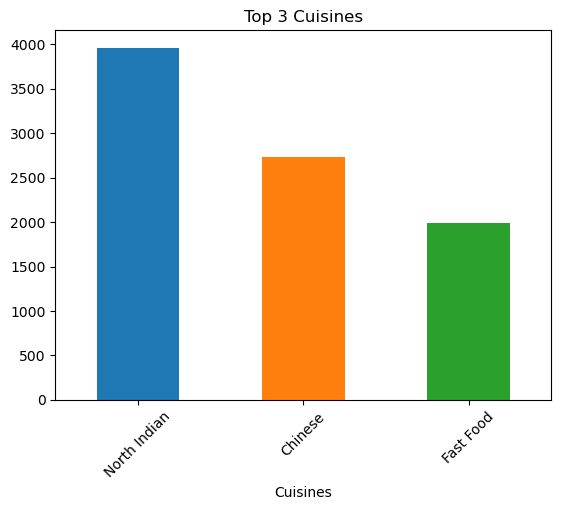

In [45]:
# Plotting a bar chart for the top three cuisines

top_cuisines.plot(kind='bar', color=['#1f77b4', '#ff7f0e', '#2ca02c'])
plt.title('Top 3 Cuisines')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.show()

In [46]:
# Level 1 Task 1 (ii) Calculate the percentage of restaurants that serve each of the top cuisines

total_restaurants = RestaurantData.shape[0]

# Calculate the % for each of the top_3 cuisines

top_cuisines_percentage = (top_cuisines / total_restaurants) * 100

# Percentages

print(top_cuisines_percentage)

Cuisines
North Indian    41.461627
Chinese         28.635745
Fast Food       20.793634
Name: count, dtype: float64


In [47]:
# Format the percentages to two decimal places
top_cuisines_percentage = top_cuisines_percentage.round(2)

# Display the formatted percentages
for cuisine, percentage in top_cuisines_percentage.items():
    print(f'{cuisine}: {percentage}% of restaurants')

North Indian: 41.46% of restaurants
Chinese: 28.64% of restaurants
Fast Food: 20.79% of restaurants


In [48]:
## Level 1 Task 2 (i)
# Get the city with the highest number of restaurants

city_counts = RestaurantData['City'].value_counts()

# Display the city with the highest number of restaurants

top_city = city_counts.idxmax()
top_city_count = city_counts.max()

print(f'The city with the highest number of restaurants is {top_city} with {top_city_count} restaurants.')

The city with the highest number of restaurants is New Delhi with 5473 restaurants.


In [49]:
# Replace incorrect characters with the correct ones

RestaurantData['City'] = RestaurantData['City'].replace({'S��o Paulo': 'São Paulo', 'Bras�_lia': 'Brasília', '��stanbul': 'Istanbul'}) 

In [50]:
## Level 1 Task 2 (ii)
# Calculate the average rating for restaurants in each city
average_rating_per_city = RestaurantData.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)
average_rating_per_city = average_rating_per_city.round(1)

# Display the average rating for each city
print(average_rating_per_city.to_string())

City
Inner City                4.9
Quezon City               4.8
Makati City               4.6
Pasig City                4.6
Mandaluyong City          4.6
Beechworth                4.6
London                    4.5
Taguig City               4.5
Tagaytay City             4.5
Secunderabad              4.5
Lincoln                   4.5
Orlando                   4.5
Tampa Bay                 4.4
Rest of Hawaii            4.4
Tanunda                   4.4
Palm Cove                 4.4
Bangalore                 4.4
Dubai                     4.4
Pasay City                4.4
Jakarta                   4.4
Hyderabad                 4.3
Chennai                   4.3
Ankara                    4.3
Tangerang                 4.3
Mohali                    4.3
Randburg                  4.3
Sandton                   4.3
Clatskanie                4.3
Vernonia                  4.3
Vineland Station          4.3
Abu Dhabi                 4.3
Istanbul                  4.3
Auckland                  4.3
Rio d

In [51]:
## Level 1 Task 2 (iii)
# Determine the city with the highest average rating

top_rated_city = average_rating_per_city.idxmax()
top_average_rating = average_rating_per_city.max()

print(f'The city with the highest average rating is "{top_rated_city}" with an average rating of {top_average_rating:.1f}')

The city with the highest average rating is "Inner City" with an average rating of 4.9


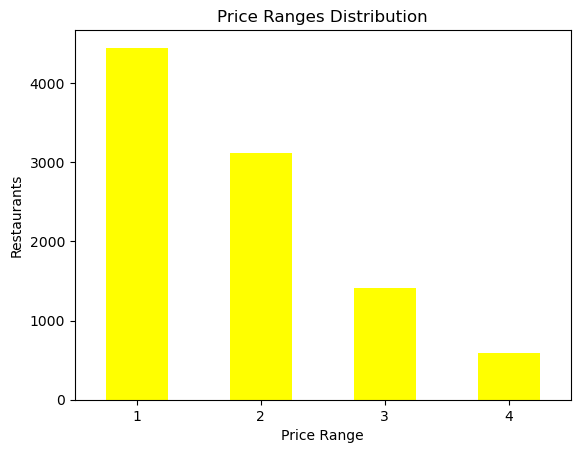

In [52]:
## Level 1 Task 3 (i): Price Range Distribution

import matplotlib.pyplot as plt

# Get the distribution of price ranges
price_range_distribution = RestaurantData['Price range'].value_counts()

# Create a histogram or bar chart to visualize the distribution of price ranges among the restaurants

price_range_distribution.plot(kind='bar', color='yellow')

plt.title('Price Ranges Distribution')
plt.xlabel('Price Range')
plt.ylabel('Restaurants')
plt.xticks(rotation=0)  # Keep x-axis labels horizontal for better readability
plt.show()

In [53]:
## Level 1 Task 3 (ii): Calculate the percentage of restaurants in each price range category

# The percentage of restaurants in each price range
price_range_percentage = (price_range_distribution / price_range_distribution.sum()) * 100

price_range_percentage_rounded = price_range_percentage.round(1) # Round the percentage to 1 decimal place

for price_range, percentage in price_range_percentage_rounded.items():
    print(f'Price Range {price_range}: {percentage}%')

Price Range 1: 46.5%
Price Range 2: 32.6%
Price Range 3: 14.7%
Price Range 4: 6.1%


In [54]:
## Level 1 Task 4 (i): Online Delivery. # Determine the percentage of restaurants that offer online delivery.

# The total number of restaurants
total_restaurants = RestaurantData.shape[0]

# The number of restaurants that offer online delivery
online_delivery_count = RestaurantData[RestaurantData['Has Online delivery'] == True].shape[0]

# The percentage of restaurants that offer online delivery
online_delivery_percentage = (online_delivery_count / total_restaurants) * 100

# The result
print(f'Restaurants that offer online delivery: {online_delivery_percentage:.2f}%')

Restaurants that offer online delivery: 25.66%


In [55]:
## Level 1 Task 4 (ii): Compare the average ratings of restaurants with and without online delivery.
# The average rating for restaurants with online delivery
average_rating_with_delivery = RestaurantData[RestaurantData['Has Online delivery'] == True]['Aggregate rating'].mean()

# The average rating for restaurants without online delivery
average_rating_without_delivery = RestaurantData[RestaurantData['Has Online delivery'] == False]['Aggregate rating'].mean()

print(f'Average rating for restaurants that Has Online delivery: {average_rating_with_delivery:.2f}')
print(f'Average rating for restaurants without Online delivery: {average_rating_without_delivery:.2f}')

Average rating for restaurants that Has Online delivery: 3.25
Average rating for restaurants without Online delivery: 2.47


In [56]:
## Level 2 Task 1 (i): Restaurant Rating
##Analyze the distribution of aggregate ratings and determine the most common rating range
# Categorize ratings into ranges (bins)
rating_bins = pd.cut(RestaurantData['Aggregate rating'], bins=[0, 1, 2, 3, 4, 5], include_lowest=True)

# Counting how many restaurants fall into each rating range
rating_range_counts = rating_bins.value_counts().sort_index()
for index, value in rating_range_counts.items():
    print(f"Rating Range {index}: {value}")

# The most common rating range
most_common_range = rating_range_counts.idxmax()
print(f"The most common rating range is: {most_common_range}")

Rating Range (-0.001, 1.0]: 2148
Rating Range (1.0, 2.0]: 10
Rating Range (2.0, 3.0]: 1891
Rating Range (3.0, 4.0]: 4388
Rating Range (4.0, 5.0]: 1114
The most common rating range is: (3.0, 4.0]


In [57]:
## Level 2 Task 1 (ii): Restaurant Rating
## Calculate the average number of votes received by restaurants

# Average number of votes received by restaurants
average_votes = RestaurantData['Votes'].mean()

# The result
print(f"The average number of votes received by restaurants is {average_votes:.2f}")

The average number of votes received by restaurants is 156.91


In [58]:
## Level 2 Task 2 (i): Cuisine Combination
## Identify the most common combinations of cuisines in the dataset

# The most common combinations of cuisines
most_common_cuisines = RestaurantData['Cuisines'].head(10)

print("Most common combinations of cuisines")
print(most_common_cuisines)

Most common combinations of cuisines
0            French, Japanese, Desserts
1                              Japanese
2      Seafood, Asian, Filipino, Indian
3                       Japanese, Sushi
4                      Japanese, Korean
5                               Chinese
6                       Asian, European
7    Seafood, Filipino, Asian, European
8               European, Asian, Indian
9                              Filipino
Name: Cuisines, dtype: object


In [59]:
## Level 2 Task 2 (ii): Cuisine Combination
## Determine if certain cuisine combinations tend to have higher ratings

# Group by 'Cuisines' and the average rating for each combination
average_ratings_by_cuisine = RestaurantData.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)

# The top cuisine combinations with the highest average ratings
print("Cuisine combinations with their average ratings")
print(average_ratings_by_cuisine.head(10))  # Change head(10) to see more results if needed

Cuisine combinations with their average ratings
Cuisines
Continental, Indian             4.9
BBQ, Breakfast, Southern        4.9
Italian, Deli                   4.9
American, Caribbean, Seafood    4.9
Burger, Bar Food, Steak         4.9
American, Burger, Grill         4.9
Italian, Bakery, Continental    4.9
European, Asian, Indian         4.9
European, Contemporary          4.9
American, Coffee and Tea        4.9
Name: Aggregate rating, dtype: float64


In [60]:
# Install required libraries for task3
# Install required libraries
!pip install folium

In [61]:
## Level 2 Task 3: Geographic Analysis
## Plot the locations of restaurants on a map using longitude and latitude coordinates
## Identify any patterns or clusters of restaurants in specific areas.

import folium
from folium.plugins import MarkerCluster

# Create a base map centered at the mean latitude and longitude of the restaurants
map_center = [RestaurantData['Latitude'].mean(), RestaurantData['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=10)

# Create a MarkerCluster object
marker_cluster = MarkerCluster().add_to(restaurant_map)

# Add markers to the MarkerCluster
for index, row in RestaurantData.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['Restaurant Name'],
        icon=folium.Icon(color='blue')
    ).add_to(marker_cluster)

# Save the map to an HTML file
restaurant_map.save("restaurant_map.html")

# The map 
restaurant_map

In [62]:
## Level 2 Task 4: Restaurant Chains
## Identify if there are any restaurant chains present in the dataset
# Count the occurrences of each restaurant name
restaurant_counts = RestaurantData['Restaurant Name'].value_counts()

# Filter for restaurants that appear more than once
restaurant_chains = restaurant_counts[restaurant_counts > 1]

# The restaurant chains and the number of locations
print(restaurant_chains)

Restaurant Name
Cafe Coffee Day       83
Domino's Pizza        79
Subway                63
Green Chick Chop      51
McDonald's            48
                      ..
Town Hall              2
Halki Aanch            2
Snack Junction         2
Delhi Biryani Hut      2
Beliram Degchiwala     2
Name: count, Length: 734, dtype: int64
